## Load Audio File to Jupiter

In [3]:
from scipy.io import wavfile
rate, x = wavfile.read('pirates-of-the-caribean.wav')

# the audio has two channels, by doing x[:,0] we select the first one

aud0 = x[:,0]
aud1 = x[:,1]

## Plot signal in Time and Frequency Domain

C:\Users\janir\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\matplotlib\axes\_axes.py:7720: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


Text(0.5, 1.0, 'Spectrogram')

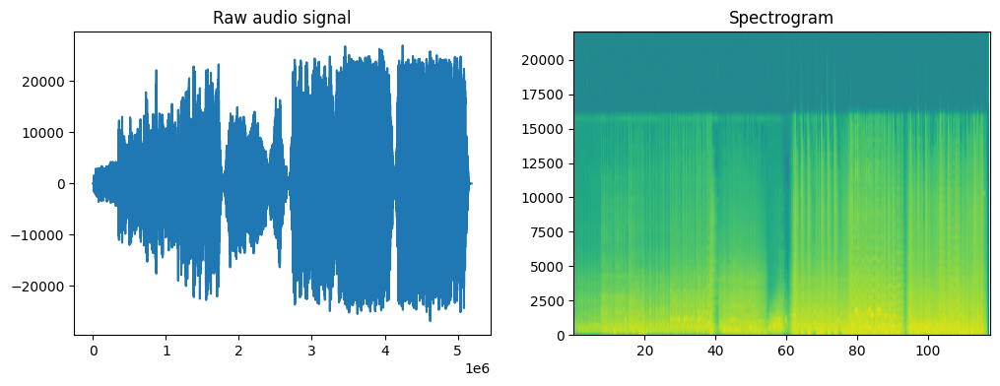

In [4]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(aud0); ax1.set_title('Raw audio signal')
ax2.specgram(aud0, Fs=rate); ax2.set_title('Spectrogram')

Text(0.5, 1.0, 'Spectrogram')

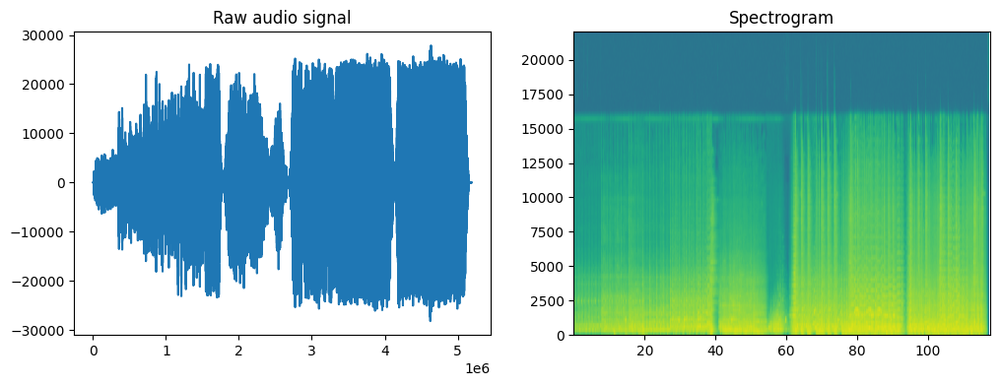

In [5]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(aud1); ax1.set_title('Raw audio signal')
ax2.specgram(aud1, Fs=rate); ax2.set_title('Spectrogram')

In [6]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load the audio file
y, sr = librosa.load('pirates-of-the-caribean.wav')

# Compute the spectrogram
S = librosa.stft(y)

# this is the number of samples in a window per fft
n_fft = 2048# The amount of samples we are shifting after each fft
hop_length = 512

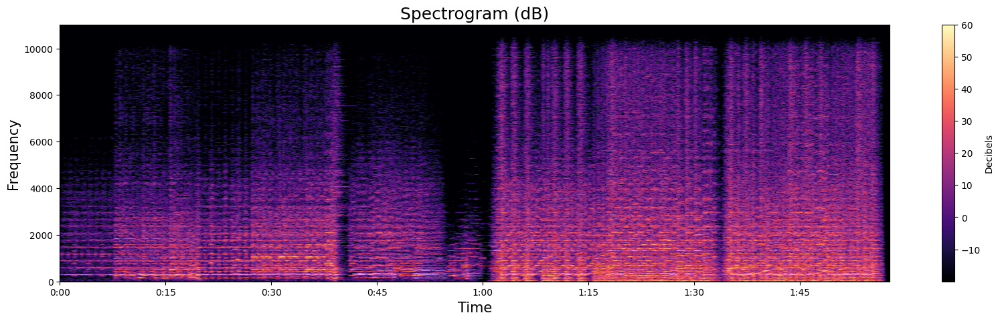

In [7]:
# Short-time Fourier Transformation on our audio data
audio_stft = librosa.core.stft(y, hop_length=hop_length, n_fft=sr)# gathering the absolute values for all values in our audio_stft 
spectrogram = np.abs(audio_stft)# Converting the amplitude to decibels
log_spectro = librosa.amplitude_to_db(spectrogram)# Plotting the short-time Fourier Transformation
plt.figure(figsize=(20, 5))# Using librosa.display.specshow() to create our spectrogram
librosa.display.specshow(log_spectro, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(label='Decibels')
plt.title('Spectrogram (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
# plt.ylim(0,1000)
plt.show()


## Filter used in the audio

If the gain of the frequency response is 1, the output signal is equal to the input signal. It is said if the power is lower than a half in dBS the signal is considered erased.


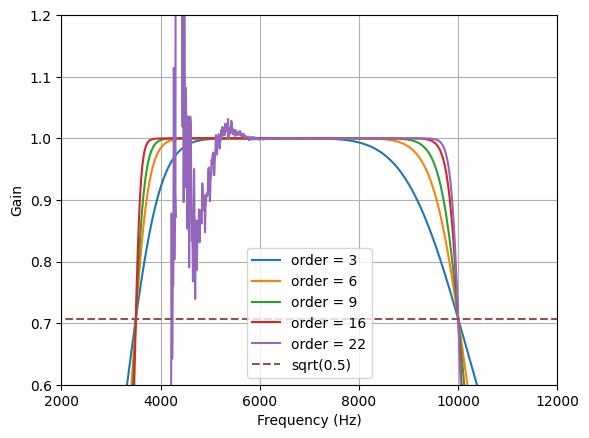

In [8]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


def run():
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = rate
    lowcut=3500
    highcut=10000

    # Plot the FREQUENCY RESPONSE for a few different orders.
    # the order of the filter changes the sharpness of the filter's edges, but be carfeful because if it is too high (n=22) it saturates .

    plt.figure(1)
    plt.clf()
    for order in [3, 6, 9, 16, 22]:
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        w, h = freqz(b, a, worN=2000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)

    plt.plot([0, 0.5 * fs], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')
    
    plt.xlim(2000,12000)
    plt.ylim(0.6,1.2)
    
    plt.show()


run()

## Filter the audio

### INSTRUMENT A

In [39]:
lowcut=3500
highcut=10000

filteredBandPass0 = butter_bandpass_filter(aud0, lowcut, highcut, rate, order=3)
filteredBandPass1 = butter_bandpass_filter(aud1, lowcut, highcut, rate, order=3)

In [40]:
audt = np.column_stack((filteredBandPass0, filteredBandPass1))

In [41]:
fs = 44100
out_f = 'instrumentA.wav'


wav = np.clip(audt, -32768, 32767)
wavfile.write(out_f, fs, wav.astype(np.int16))

### INSTRUMENT B

In [47]:
lowcut=50
highcut=200

filteredBandPass0 = butter_bandpass_filter(aud0, lowcut, highcut, rate, order=3)
filteredBandPass1 = butter_bandpass_filter(aud1, lowcut, highcut, rate, order=3)

In [48]:
audt = np.column_stack((filteredBandPass0, filteredBandPass1))

In [50]:
fs = 44100
out_f = 'instrumentB.wav'


wav = np.clip(audt, -32768, 32767)
wavfile.write(out_f, fs, wav.astype(np.int16))

### INSTRUMENT C

In [63]:
lowcut=165  
highcut=988

filteredBandPass0 = butter_bandpass_filter(aud0, lowcut, highcut, rate, order=3)
filteredBandPass1 = butter_bandpass_filter(aud1, lowcut, highcut, rate, order=3)

In [64]:
audt = np.column_stack((filteredBandPass0, filteredBandPass1))

In [65]:
fs = 44100
out_f = 'instrumentC.wav'


wav = np.clip(audt, -32768, 32767)
wavfile.write(out_f, fs, wav.astype(np.int16))

## Play the result

In [66]:
from scipy.io import wavfile
rate, x = wavfile.read('instrumentC.wav')


audt0 = x[:,0]
audt1 = x[:,1]

In [67]:
import numpy as np
import IPython

IPython.display.Audio(audt0, rate=rate)
# IPython.display.Audio(aud1, rate=rate)
# IPython.display.Audio(filteredBandPassC, rate=rate)

 ## Plot the results in Time and Frequency Domain

In [44]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load the audio file
yA, sr = librosa.load('instrumentA.wav')
yB, sr = librosa.load('instrumentB.wav')
yC, sr = librosa.load('instrumentC.wav')

# Compute the spectrogram
S = librosa.stft(y)

INSTRUMENT A

In [ ]:
# Short-time Fourier Transformation on our audio data
audio_stft = librosa.core.stft(yA, hop_length=hop_length, n_fft=sr)# gathering the absolute values for all values in our audio_stft 
spectrogram = np.abs(audio_stft)# Converting the amplitude to decibels
log_spectro = librosa.amplitude_to_db(spectrogram)# Plotting the short-time Fourier Transformation

In [ ]:
plt.figure(figsize=(20, 5))# Using librosa.display.specshow() to create our spectrogram
librosa.display.specshow(log_spectro, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(label='Decibels')
plt.title('Spectrogram Instrument A (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
# plt.ylim(0,1000)
plt.show()

INSTRUMENT B

In [ ]:
# Short-time Fourier Transformation on our audio data
audio_stft = librosa.core.stft(yB, hop_length=hop_length, n_fft=sr)# gathering the absolute values for all values in our audio_stft 
spectrogram = np.abs(audio_stft)# Converting the amplitude to decibels
log_spectro = librosa.amplitude_to_db(spectrogram)# Plotting the short-time Fourier Transformation

In [ ]:
plt.figure(figsize=(20, 5))# Using librosa.display.specshow() to create our spectrogram
librosa.display.specshow(log_spectro, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(label='Decibels')
plt.title('Spectrogram Instrument A (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
# plt.ylim(0,1000)
plt.show()

INSTRUMENT C

In [ ]:
# Short-time Fourier Transformation on our audio data
audio_stft = librosa.core.stft(yC, hop_length=hop_length, n_fft=sr)# gathering the absolute values for all values in our audio_stft 
spectrogram = np.abs(audio_stft)# Converting the amplitude to decibels
log_spectro = librosa.amplitude_to_db(spectrogram)# Plotting the short-time Fourier Transformation

In [ ]:
plt.figure(figsize=(20, 5))# Using librosa.display.specshow() to create our spectrogram
librosa.display.specshow(log_spectro, sr=sr, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(label='Decibels')
plt.title('Spectrogram Instrument A (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
# plt.ylim(0,1000)
plt.show()

## Recognize the instrument

In [70]:
from pydub import AudioSegment
from pydub.silence import split_on_silence
from pydub.utils import make_chunks 

# Load the audio file
audio = AudioSegment.from_file('instrumentA.wav')
# Split the audio into segments using silence detection

chunk_length_ms = 7500 # pydub calculates in millisec 
chunks = make_chunks(audio,chunk_length_ms) #Make chunks of one sec 

i=0

# Iterate over the segments and check if the violin is playing
for segment in chunks:
    
    # Calculate the volume (loudness) of the segment
    volume = segment.rms
    print(f"time: {i*7.5},decibels: {volume}")
    
    # If the volume is above a certain threshold, the violin is playing
    if volume > 200:
        print("Violin is playing")
    else:
        print("Violin is not playing")

    i+=1

time: 0.0,decibels: 65
Violin is not playing
time: 7.5,decibels: 196
Violin is not playing
time: 15.0,decibels: 207
Violin is playing
time: 22.5,decibels: 253
Violin is playing
time: 30.0,decibels: 347
Violin is playing
time: 37.5,decibels: 417
Violin is playing
time: 45.0,decibels: 293
Violin is playing
time: 52.5,decibels: 66
Violin is not playing
time: 60.0,decibels: 737
Violin is playing
time: 67.5,decibels: 656
Violin is playing
time: 75.0,decibels: 918
Violin is playing
time: 82.5,decibels: 937
Violin is playing
time: 90.0,decibels: 802
Violin is playing
time: 97.5,decibels: 880
Violin is playing
time: 105.0,decibels: 1036
Violin is playing
time: 112.5,decibels: 820
Violin is playing


In [57]:
# Load the audio file
audio = AudioSegment.from_file('instrumentB.wav')
# Split the audio into segments using silence detection

chunk_length_ms = 7500 # pydub calculates in millisec 
chunks = make_chunks(audio,chunk_length_ms) #Make chunks of one sec

i=0

# Iterate over the segments and check if the violin is playing
for segment in chunks:
    
        # Calculate the volume (loudness) of the segment
    volume = segment.rms
    print(f"time: {i*7.5},decibels: {volume}")
    
    # If the volume is above a certain threshold, the violin is playing
    if volume > 1200:
        print("Timbals is playing")
    else:
        print("Timbals is not playing")

    i+=1

time: 0.0,decibels: 154
Timbals is not playing
time: 7.5,decibels: 885
Timbals is not playing
time: 15.0,decibels: 1088
Timbals is not playing
time: 22.5,decibels: 576
Timbals is not playing
time: 30.0,decibels: 602
Timbals is not playing
time: 37.5,decibels: 1764
Timbals is playing
time: 45.0,decibels: 2159
Timbals is playing
time: 52.5,decibels: 1005
Timbals is not playing
time: 60.0,decibels: 1902
Timbals is playing
time: 67.5,decibels: 2344
Timbals is playing
time: 75.0,decibels: 2698
Timbals is playing
time: 82.5,decibels: 2692
Timbals is playing
time: 90.0,decibels: 2356
Timbals is playing
time: 97.5,decibels: 2330
Timbals is playing
time: 105.0,decibels: 2328
Timbals is playing
time: 112.5,decibels: 2063
Timbals is playing


In [69]:
# Load the audio file
audio = AudioSegment.from_file('instrumentC.wav')
# Split the audio into segments using silence detection

chunk_length_ms = 7500 # pydub calculates in millisec 
chunks = make_chunks(audio,chunk_length_ms) #Make chunks of one sec

i=0

# Iterate over the segments and check if the violin is playing
for segment in chunks:
    
        # Calculate the volume (loudness) of the segment
    volume = segment.rms
    print(f"time: {i*7.5},decibels: {volume}")
    
    # If the volume is above a certain threshold, the violin is playing
    if volume > 3000:
        print("Trumpet is playing")
    else:
        print("Trumpet is not playing")

    i+=1

time: 0.0,decibels: 1098
Trumpet is not playing
time: 7.5,decibels: 2082
Trumpet is not playing
time: 15.0,decibels: 2911
Trumpet is not playing
time: 22.5,decibels: 2860
Trumpet is not playing
time: 30.0,decibels: 3596
Trumpet is playing
time: 37.5,decibels: 3738
Trumpet is playing
time: 45.0,decibels: 3734
Trumpet is playing
time: 52.5,decibels: 2797
Trumpet is not playing
time: 60.0,decibels: 4077
Trumpet is playing
time: 67.5,decibels: 4853
Trumpet is playing
time: 75.0,decibels: 5451
Trumpet is playing
time: 82.5,decibels: 5824
Trumpet is playing
time: 90.0,decibels: 4972
Trumpet is playing
time: 97.5,decibels: 5811
Trumpet is playing
time: 105.0,decibels: 5162
Trumpet is playing
time: 112.5,decibels: 4127
Trumpet is playing
